In [6]:
import tensorflow as tf
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
%matplotlib inline


from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.applications import VGG16


import os
import random
from random import shuffle
import cv2
import shutil

import glob
import time




os.environ['KMP_DUPLICATE_LIB_OK']='True' # This prevents kernel shut down due to xgboost conflict
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' # This line prevents tf's comments about the optimizing your machine

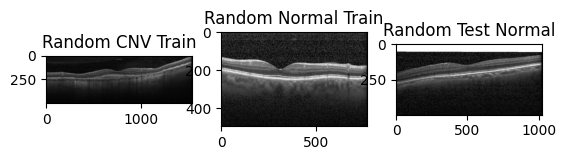

(496, 1536, 3)
(496, 768, 3)
(496, 1024, 3)


In [9]:
# Looking at image size/shape
img = cv2.imread('train/CNV/CNV-81630-20.jpeg')

# Get image shape
img_2 =  cv2.imread('train/NORMAL/NORMAL-1384-5.jpeg')    

img_3 = cv2.imread('test/NORMAL/NORMAL-55652-1.jpeg')

fig, axs = plt.subplots(1, 3)  
axs[0].imshow(img)
axs[0].set_title('Random CNV Train')

axs[1].imshow(img_2)
axs[1].set_title('Random Normal Train')

axs[2].imshow(img_3)
axs[2].set_title('Random Test Normal')

plt.show()
print(img.shape)
print(img_2.shape)
print(img_3.shape)
# as we can see, there's wide variation in shape and errors in imaging (whether in image capture or scanning)

In [7]:
# What color channels are we working with? We need to use Image from PIL because C2V converts to its own color scale, "BGR"

color_img = Image.open('train/CNV/CNV-81630-20.jpeg')
img_gray = color_img.convert('L')

print(color_img.mode)
print(img_gray.mode)

# We're in grayscale! But we still need to convert because this datatype is having issues below - we want this grayscale as 'uint8' 

L
L


In [8]:
# Let's look at the distributions of our textures and grayscales across the datasets:



# The directory where your images are stored
train_cnv_dir = '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/train/CNV'
train_normal_dir = '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/train/NORMAL'
test_cnv_dir = '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/test/CNV'
test_normal_dir = '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/test/NORMAL'

# Going to sample because we don't want to crash the kernal
num_samples = 100

# Get a list of all files in each directory
train_cnv_images = [image_name for image_name in os.listdir(train_cnv_dir)]
train_normal_images = [image_name for image_name in os.listdir(train_normal_dir)]
test_cnv_images = [image_name for image_name in os.listdir(test_cnv_dir)]
test_normal_images = [image_name for image_name in os.listdir(test_normal_dir)]

# Sample each list
sampled_train_cnv = random.sample(train_cnv_images, num_samples)
sampled_train_normal = random.sample(train_normal_images, num_samples)
sampled_test_cnv = random.sample(test_cnv_images, num_samples)
sampled_test_normal = random.sample(test_normal_images, num_samples)


directories = ['/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/train/CNV',
               '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/train/NORMAL',
               '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/test/CNV',
               '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/test/NORMAL'
              ]

In [12]:
# Let's check out grayscale texture anaylsis!
from skimage import io, feature, color
from skimage.feature import graycomatrix, graycoprops
import pydicom
def calculate_texture_metrics(directories):
   
    contrasts = []
    dissimilarities = []
    homogeneities = []
    energies = []
    correlations = []

   
    for directory in directories:
        # Initialize lists to store texture metrics for this directory
        directory_contrasts = []
        directory_dissimilarities = []
        directory_homogeneities = []
        directory_energies = []
        directory_correlations = []

        # Process each image
        for image_path in directory:
            try: 
            # Load the image
                image = io.imread(image_path)

            # Rescale to work with this module
                image_8bit = np.array(image * 255, dtype=np.uint8)

            # Compute the GLCM.
                glcm = graycomatrix(image_8bit, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)

            # Compute GLCM properties
                contrast = graycoprops(glcm, 'contrast')[0, 0]
                dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0]
                homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
                energy = graycoprops(glcm, 'energy')[0, 0]
                correlation = graycoprops(glcm, 'correlation')[0, 0]

            # Append the texture metrics to the directory-specific lists
                directory_contrasts.append(contrast)
                directory_dissimilarities.append(dissimilarity)
                directory_homogeneities.append(homogeneity)
                directory_energies.append(energy)
                directory_correlations.append(correlation)
                
            except FileNotFoundError as e:
                print(f"Error loading image: {image_path}")
                print(e)

        # Append the directory-specific lists to the global lists
            contrasts.append(directory_contrasts)
            dissimilarities.append(directory_dissimilarities)
            homogeneities.append(directory_homogeneities)
            energies.append(directory_energies)
            correlations.append(directory_correlations)

    # Create a stacked bar chart to visualize the texture metrics
    metrics = ['Contrast', 'Dissimilarity', 'Homogeneity', 'Energy', 'Correlation']
    values = [contrasts, dissimilarities, homogeneities, energies, correlations]

    
    fig, ax = plt.subplots()
    for i, metric in enumerate(metrics):
        ax.bar(range(len(directories)), [np.mean(val) for val in values[i]], label=metric)

    ax.set_xlabel('Image Directories')
    ax.set_ylabel('Average Value')
    ax.set_title('Texture Metrics Analysis')
    ax.legend()
    plt.xticks(range(len(image_dirs)), [str(i) for i in range(len(image_dirs))], rotation=45)
    plt.tight_layout()
    plt.show()


In [13]:

from skimage import feature, color
import pydicom

def calculate_texture_metrics(image_dirs):
    # Initialize lists to store texture metrics
    contrasts = []
    dissimilarities = []
    homogeneities = []
    energies = []
    correlations = []

    # Process each image directory
    for directory in image_dirs:
        # Initialize lists to store texture metrics for this directory
        directory_contrasts = []
        directory_dissimilarities = []
        directory_homogeneities = []
        directory_energies = []
        directory_correlations = []

        # Process each image file in the directory
        for file in os.listdir(directory):
            file_path = os.path.join(directory, file)
            if os.path.isfile(file_path):
                try:
                    # Read DICOM file
                    image = plt.imread(file_path).copy()

                    # Compute texture features
                    glcm = feature.graycomatrix(image, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
                    contrast = feature.graycoprops(glcm, 'contrast')[0, 0]
                    dissimilarity = feature.graycoprops(glcm, 'dissimilarity')[0, 0]
                    homogeneity = feature.graycoprops(glcm, 'homogeneity')[0, 0]
                    energy = feature.graycoprops(glcm, 'energy')[0, 0]
                    correlation = feature.graycoprops(glcm, 'correlation')[0, 0]

                    # Append the texture metrics to the directory-specific lists
                    directory_contrasts.append(contrast)
                    directory_dissimilarities.append(dissimilarity)
                    directory_homogeneities.append(homogeneity)
                    directory_energies.append(energy)
                    directory_correlations.append(correlation)

                except Exception as e:
                    print(f"Error processing image: {file_path}")
                    print(e)

        # Append the directory-specific lists to the global lists
        contrasts.append(directory_contrasts)
        dissimilarities.append(directory_dissimilarities)
        homogeneities.append(directory_homogeneities)
        energies.append(directory_energies)
        correlations.append(directory_correlations)

    # Create a stacked bar chart to visualize the texture metrics
    metrics = ['Contrast', 'Dissimilarity', 'Homogeneity', 'Energy', 'Correlation']
    values = [contrasts, dissimilarities, homogeneities, energies, correlations]

    fig, ax = plt.subplots()
    for i, metric in enumerate(metrics):
        ax.bar(range(len(image_dirs)), [np.mean(val) for val in values[i]], label=metric)

    ax.set_xlabel('Image Directories')
    ax.set_ylabel('Average Value')
    ax.set_title('Texture Metrics Analysis')
    ax.legend()
    plt.xticks(range(len(image_dirs)), [str(i) for i in range(len(image_dirs))], rotation=45)
    plt.tight_layout()
    plt.show()


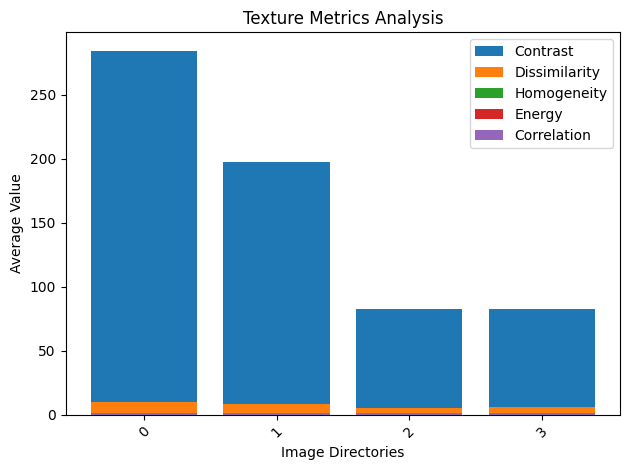

In [14]:
calculate_texture_metrics(directories)

In [ ]:
# Our directories are all prelly well-balanced!

### Contrast:
Contrast measures the local intensity variations in an image. It quantifies the difference between the average intensity of a pixel and its neighboring pixels. A higher contrast value indicates a greater difference in intensity values between neighboring pixels, resulting in more distinct boundaries or texture patterns.

### Dissimilarity: 
Dissimilarity measures the difference or diversity in pixel intensities between neighboring pixels. It indicates the average amount of change in intensity between a pixel and its neighbors. A higher dissimilarity value suggests greater variation in pixel intensities, indicating more complex or diverse textures.

### Homogeneity: 
Homogeneity quantifies the similarity or uniformity of pixel intensities within an image or a specific region. It measures the closeness of pixel values to the diagonal elements in the gray level co-occurrence matrix (GLCM). A higher homogeneity value indicates that neighboring pixels have similar intensity values, implying a more homogeneous or uniform texture.

### Energy: 
Energy, also known as Angular Second Moment (ASM), measures the overall uniformity or smoothness of an image texture. It is calculated as the sum of squared GLCM elements. A higher energy value suggests a more uniform distribution of pixel intensities, indicating a smoother or less complex texture.

### Correlation: 
Correlation measures the linear dependency between pixel intensities in an image or a specific region. It quantifies the similarity in pixel intensity patterns across the image. A higher correlation value indicates a stronger linear relationship between pixel intensities, suggesting a more predictable or repetitive texture pattern.




In [19]:
def grayscale_distributions(directories, labels, colors):
    plt.figure(figsize=(10, 6))
    for i, directory in enumerate(directories):
        all_pixels = []
        for image in directory:
            # Only process .jpg or .jpeg files
            if image.endswith('.jpeg') or image.endswith('.jpg'):
                img = image.encode('utf-8')
                img_2 = np.frombuffer(img, dtype=np.uint8)
                img_array = np.array(img_2).flatten()
                
                # Add the pixel values from this image to the list
                all_pixels.extend(img_array)
        
        # Convert the list of all pixel values to a numpy array
        all_pixels_array = np.array(all_pixels)

        # Compute and print some summary statistics
        print('For ' + labels[i] + ':')
        print('Mean:', np.mean(all_pixels_array))
        print('Standard deviation:', np.std(all_pixels_array))
        print('Minimum:', np.min(all_pixels_array))
        print('Maximum:', np.max(all_pixels_array))

        plt.hist(all_pixels_array, bins=256, color=colors[i], alpha=0.8, label=labels[i])
    
    plt.title('Grayscale Histogram')
    plt.xlabel('Grayscale Value')
    plt.ylabel('Pixels')
    plt.legend()

    plt.show()




For Train CNV:
Mean: 66.23145712782745
Standard deviation: 22.855355143586863
Minimum: 45
Maximum: 112
For Train Normal:
Mean: 67.9911214953271
Standard deviation: 21.5366112029431
Minimum: 45
Maximum: 112
For Test CNV:
Mean: 67.29767968307867
Standard deviation: 23.354474461122763
Minimum: 45
Maximum: 112
For Test Normal:
Mean: 68.38232468780019
Standard deviation: 21.699786290360457
Minimum: 45
Maximum: 112


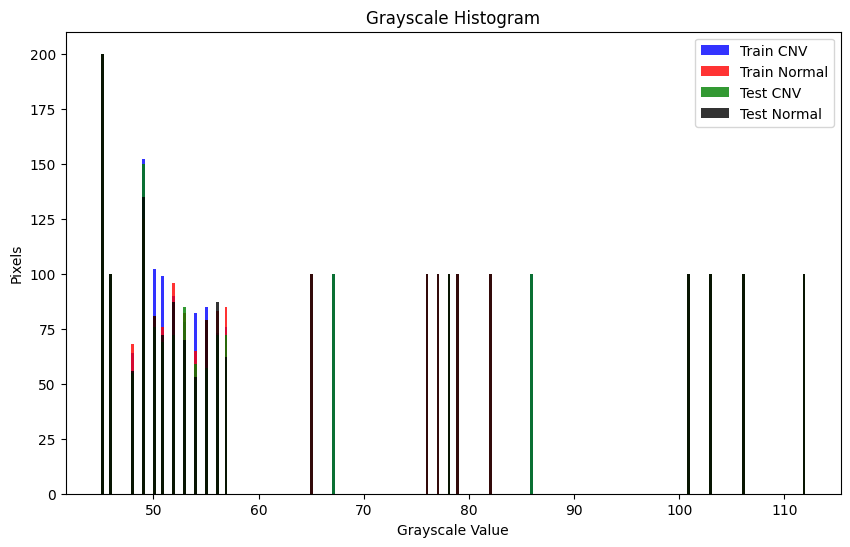

In [20]:
directories = [sampled_train_cnv, sampled_train_normal, sampled_test_cnv, sampled_test_normal]  
labels = ['Train CNV', 'Train Normal', 'Test CNV', 'Test Normal']
colors = ['blue', 'red', 'green', 'black']
grayscale_distributions(directories, labels, colors)


In [21]:


# Let's try this again, but using a scatter plot. Trying to make the information more apparent.

def grayscale_distributions_scatter(directories, labels, colors):
    plt.figure(figsize=(10, 6))
    histograms = []
    bins = np.linspace(0, 256, 255)  # Bin edges for histogram
    for i, directory in enumerate(directories):
        all_pixels = []
        for image in directory:
            # Only process .jpg or .jpeg files
            if image.endswith('.jpeg') or image.endswith('.jpg'):
                img = image.encode('utf-8')
                img_2 = np.frombuffer(img, dtype=np.uint8)
                img_array = np.array(img_2).flatten()
                
                # Add the pixel values from this image to the list
                all_pixels.extend(img_array)
        
        # Convert the list of all pixel values to a numpy array
        all_pixels_array = np.array(all_pixels)

        # Compute and print some summary statistics
        print('For ' + labels[i] + ':')
        print('Mean:', np.mean(all_pixels_array))
        print('Standard deviation:', np.std(all_pixels_array))
        print('Minimum:', np.min(all_pixels_array))
        print('Maximum:', np.max(all_pixels_array))
        
        
        # Compute histogram for this directory and add it to the list
        histogram, _ = np.histogram(all_pixels_array, bins=bins)
        histograms.append(histogram)

    # Plot scatter
    for i, histogram in enumerate(histograms):
        plt.scatter(bins[:-1], histogram, color=colors[i], alpha=0.5, label=labels[i])
    
    plt.title('Grayscale Scatterplot')
    plt.xlabel('Grayscale Value')
    plt.ylabel('Pixels')
    plt.legend(loc='upper right')

    plt.show()



For Train CNV:
Mean: 66.23145712782745
Standard deviation: 22.855355143586863
Minimum: 45
Maximum: 112
For Train Normal:
Mean: 67.9911214953271
Standard deviation: 21.5366112029431
Minimum: 45
Maximum: 112
For Test CNV:
Mean: 67.29767968307867
Standard deviation: 23.354474461122763
Minimum: 45
Maximum: 112
For Test Normal:
Mean: 68.38232468780019
Standard deviation: 21.699786290360457
Minimum: 45
Maximum: 112


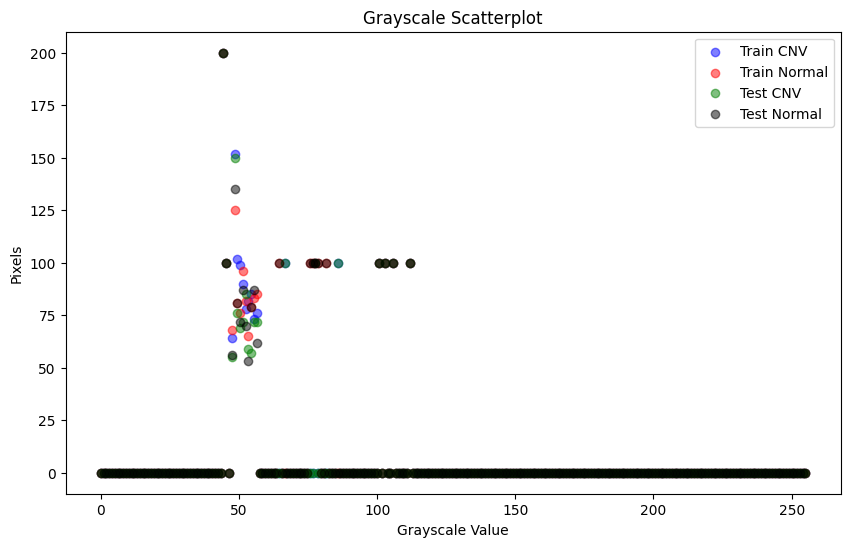

In [22]:

directories_1 = [sampled_train_cnv, sampled_train_normal, sampled_test_cnv, sampled_test_normal]
grayscale_distributions_scatter(directories_1, labels, colors)

For Train CNV:
Mean: 66.23145712782745
Standard deviation: 22.855355143586863
Minimum: 45
Maximum: 112
For Train Normal:
Mean: 67.9911214953271
Standard deviation: 21.5366112029431
Minimum: 45
Maximum: 112
For Test CNV:
Mean: 67.29767968307867
Standard deviation: 23.354474461122763
Minimum: 45
Maximum: 112


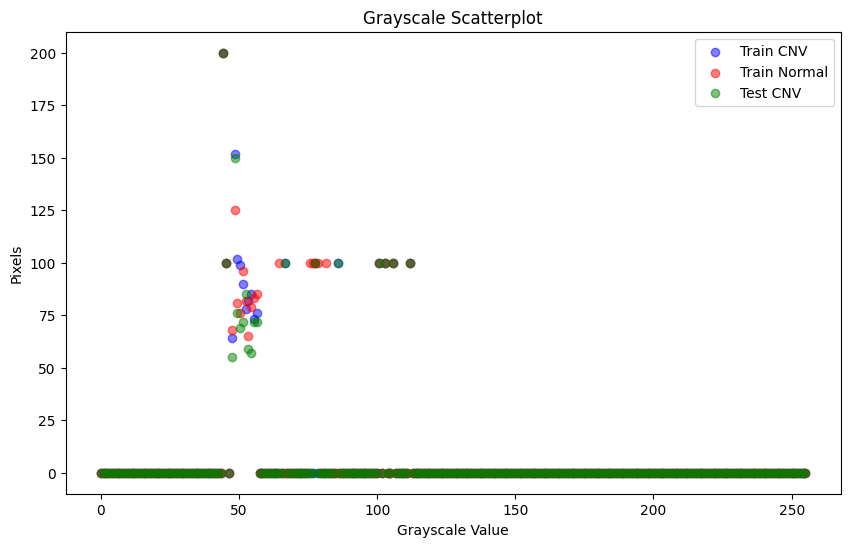

In [23]:
# Running without test normal so we can see other colors:

directories_2 = [sampled_train_cnv, sampled_train_normal, sampled_test_cnv]
grayscale_distributions_scatter(directories_2, labels, colors)


For Train CNV:
Mean: 66.23145712782745
Standard deviation: 22.855355143586863
Minimum: 45
Maximum: 112
For Train Normal:
Mean: 67.9911214953271
Standard deviation: 21.5366112029431
Minimum: 45
Maximum: 112


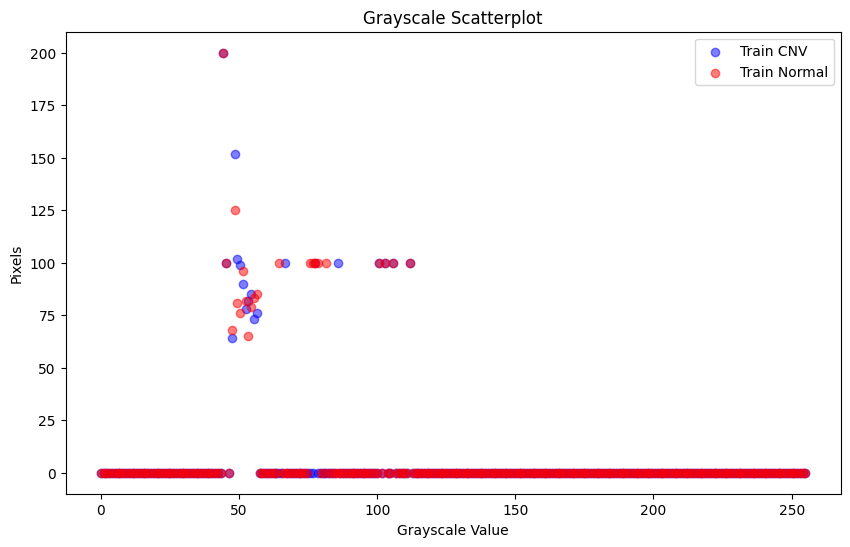

In [24]:

directories_3 = [sampled_train_cnv, sampled_train_normal]
grayscale_distributions_scatter(directories_3, labels, colors)

For Train CNV:
Mean: 66.23145712782745
Standard deviation: 22.855355143586863
Minimum: 45
Maximum: 112


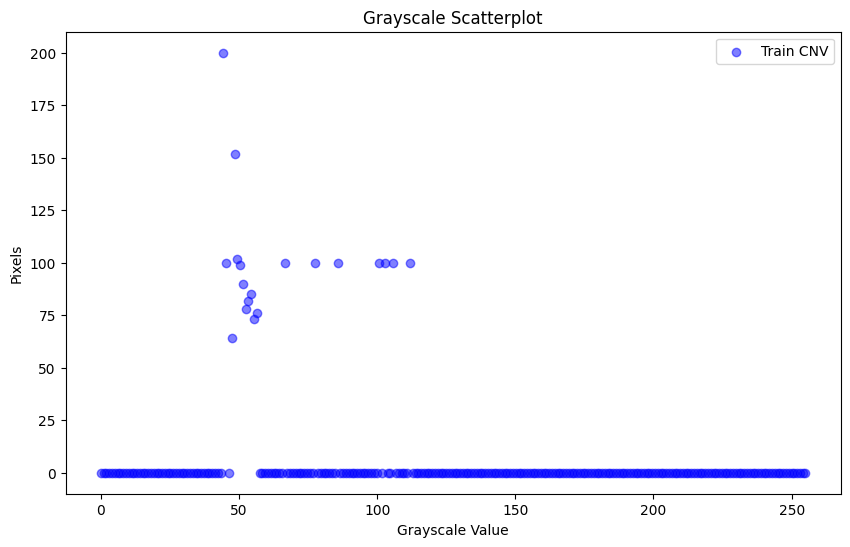

In [25]:

directories_4 = [sampled_train_cnv]
grayscale_distributions_scatter(directories_4, labels, colors)

In [9]:
train_image_path_cnv = '/train/CNV'
train_image_path_normal = '/train/NORMAL'
test_image_path_cnv = '/test/CNV'
test_image_path_normal = '/test/NORMAL'

In [10]:
# create training data
# check rgb channels
train_dir = 'train/'

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=.2, horizontal_flip=True, fill_mode='nearest')

# creating generators
train_generator = train_datagen.flow_from_directory(train_dir, target_size=(224, 224), color_mode="grayscale", shuffle=True,batch_size=32, class_mode='binary', seed=42)


validation_generator = train_datagen.flow_from_directory(train_dir, target_size=(224, 224),batch_size=32, color_mode='grayscale',
                            class_mode='binary',shuffle=True,seed=42,subset='validation')



Found 58222 images belonging to 2 classes.
Found 11644 images belonging to 2 classes.


In [11]:
# Generate test data

test_dir = 'test/'
test_datagen = ImageDataGenerator(rescale=1./255,horizontal_flip=True, fill_mode='nearest')
test_generator = train_datagen.flow_from_directory(test_dir, target_size=(224, 224), color_mode="grayscale", 
                                                    batch_size=32, class_mode='binary', shuffle=True, seed=42)
# 

# Shuffle and seed important! Shuffle especially since it is apparent that images are clustered together in particular
# ways within the folders, and we need to introduce a little stochasticity!


Found 500 images belonging to 2 classes.


In [29]:
# We have very large training and validation sets compared to our test set

In [30]:
image_shape_train = train_generator.image_shape
image_shape_validation = validation_generator.image_shape
image_shape_test = test_generator.image_shape
print(f'The shape of the images is: {image_shape_train, image_shape_validation,image_shape_test}')

The shape of the images is: ((224, 224, 1), (224, 224, 1), (224, 224, 1))


In [31]:
train_labels = train_generator.classes
label, count = np.unique(train_labels, return_counts=True)
label_count = list(zip(label, count))
print(f'Train Label Count: {label_count}')

validation_labels = validation_generator.classes
label, count = np.unique(validation_labels, return_counts=True)
label_count = list(zip(label, count))
print(f'Validation Label Count: {label_count}')

test_labels = test_generator.classes
label, count = np.unique(test_labels, return_counts=True)
label_count = list(zip(label, count))
print(f'Test Label Count: {label_count}')

# Evenly split test data. very small sample size! 

Train Label Count: [(0, 7082), (1, 51140)]
Validation Label Count: [(0, 1416), (1, 10228)]
Test Label Count: [(0, 250), (1, 250)]


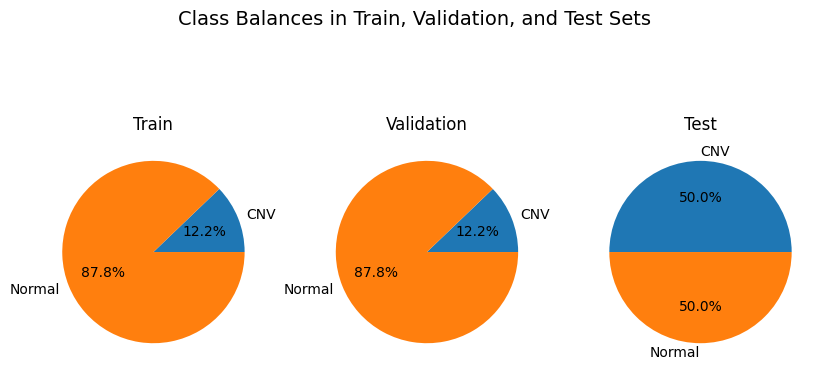

In [32]:
# Pie chart for label distributions
fig, ax = plt.subplots(1, 3, figsize=(10,5))
labels_1, counts_1 = np.unique(train_labels, return_counts=True)
labels_2, counts_2 = np.unique(validation_labels, return_counts=True)
labels_3, counts_3 = np.unique(test_labels, return_counts=True)
labels_1 = ['CNV' if label==0 else 'Normal' for label in labels_1]
labels_2 = ['CNV' if label==0 else 'Normal' for label in labels_2]
labels_3 = ['CNV' if label==0 else 'Normal' for label in labels_3]


ax[0].pie(counts_1, labels=labels_1, autopct='%1.1f%%')
ax[0].set_title("Train")
ax[1].pie(counts_2, labels=labels_2, autopct='%1.1f%%')
ax[1].set_title('Validation')
ax[2].pie(counts_3, labels=labels_3, autopct='%1.1f%%')
ax[2].set_title('Test')
fig.text(0.5, 0.98, 'Class Balances in Train, Validation, and Test Sets', ha='center', va='top', fontsize=14)


plt.show()


In [33]:
# Create a function that displays random images from our datasets along with their class labels



def display_all_images(data, num_batches):
  
    # Get the class names
    class_names = list(data.class_indices.keys())

    for batch_num in range(num_batches):
        # Get a batch of data
        images, labels = next(data)

        # Get the number of images
        num_images = images.shape[0]

        # Calculate the number of rows and columns for the grid
        num_cols = 4
        num_rows = num_images // num_cols if num_images % num_cols == 0 else num_images // num_cols + 1

        # Create a figure
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
        axes = axes.ravel()

        # Plot each image
        for i in range(num_images):
            img = images[i]
            label = labels[i]
            class_name = class_names[np.argmax(label)]

            axes[i].imshow(img, cmap='gray')
            axes[i].set_title(class_name)
            axes[i].axis('off')

        # Remove the axes for any unused subplots
        if num_images < num_rows * num_cols:
            for i in range(num_images, num_rows * num_cols):
                fig.delaxes(axes[i])

        # Show the plot
        plt.tight_layout()
        plt.show()



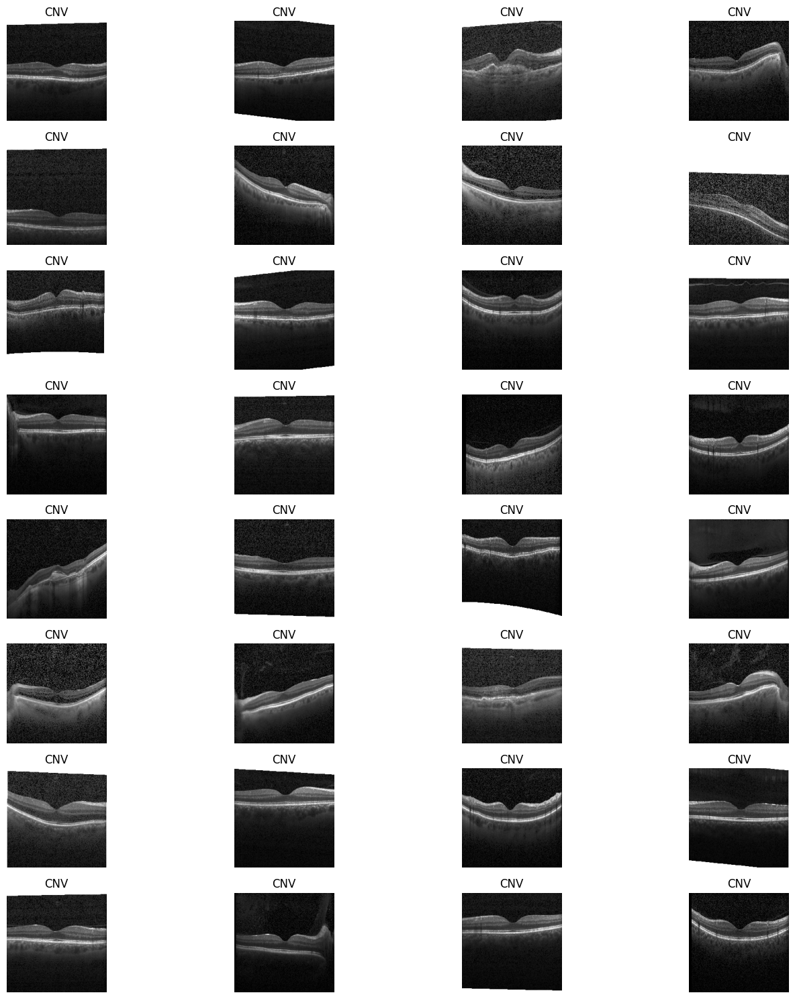

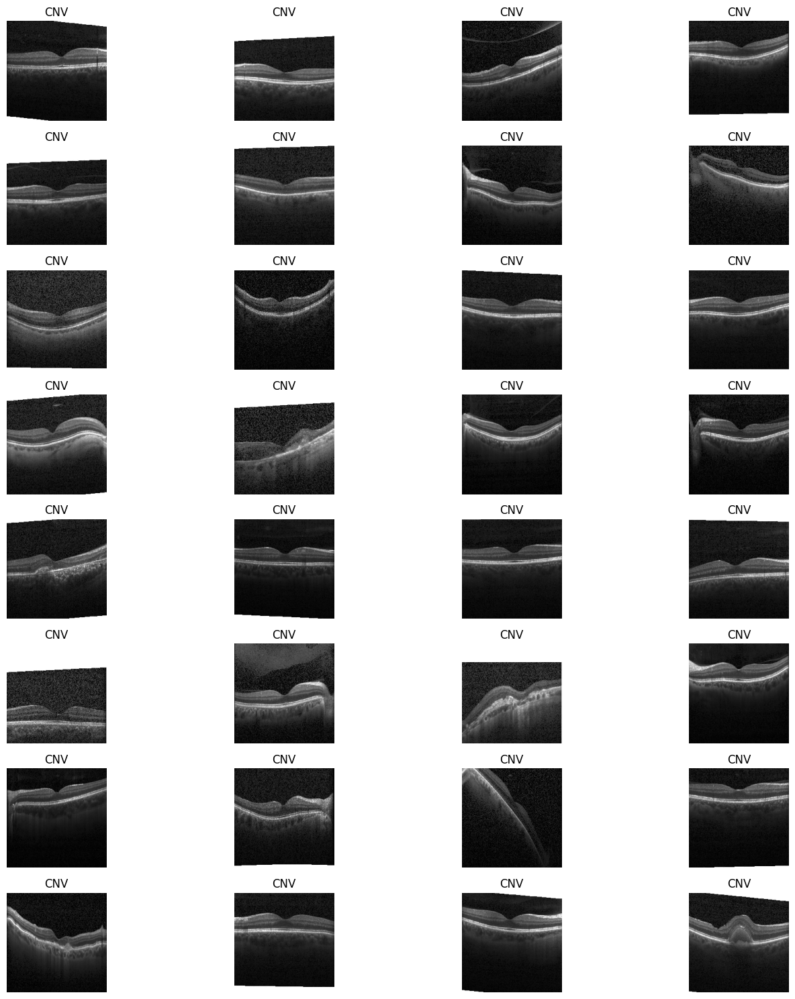

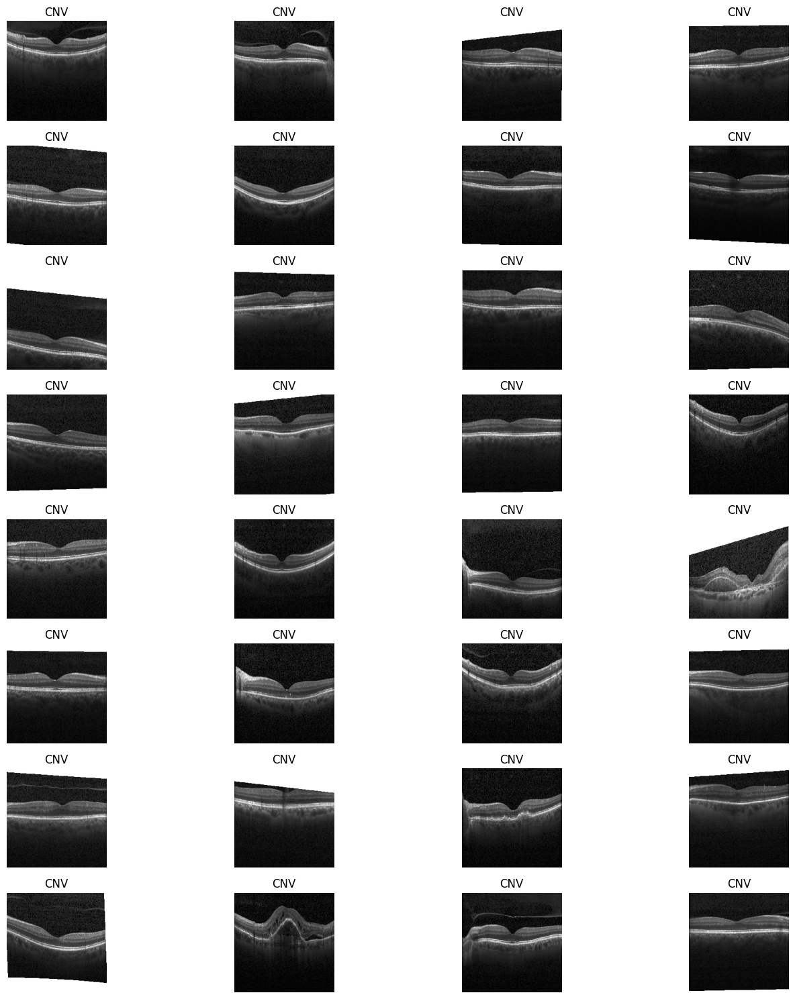

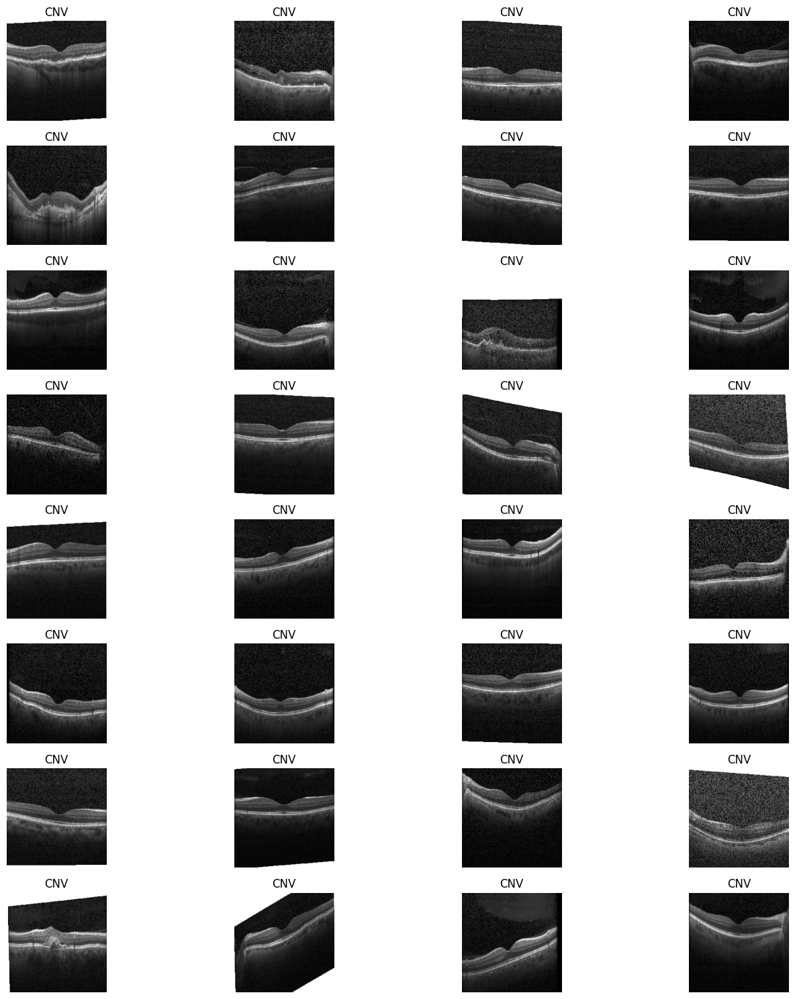

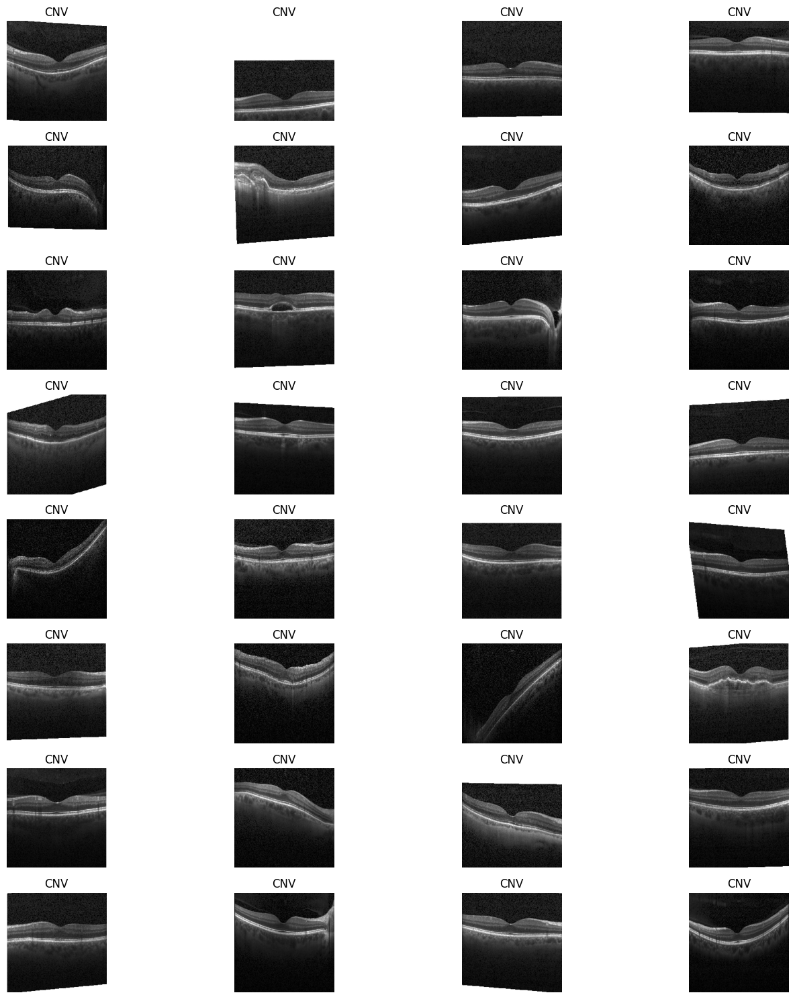

In [34]:

display_all_images(train_generator, 5)





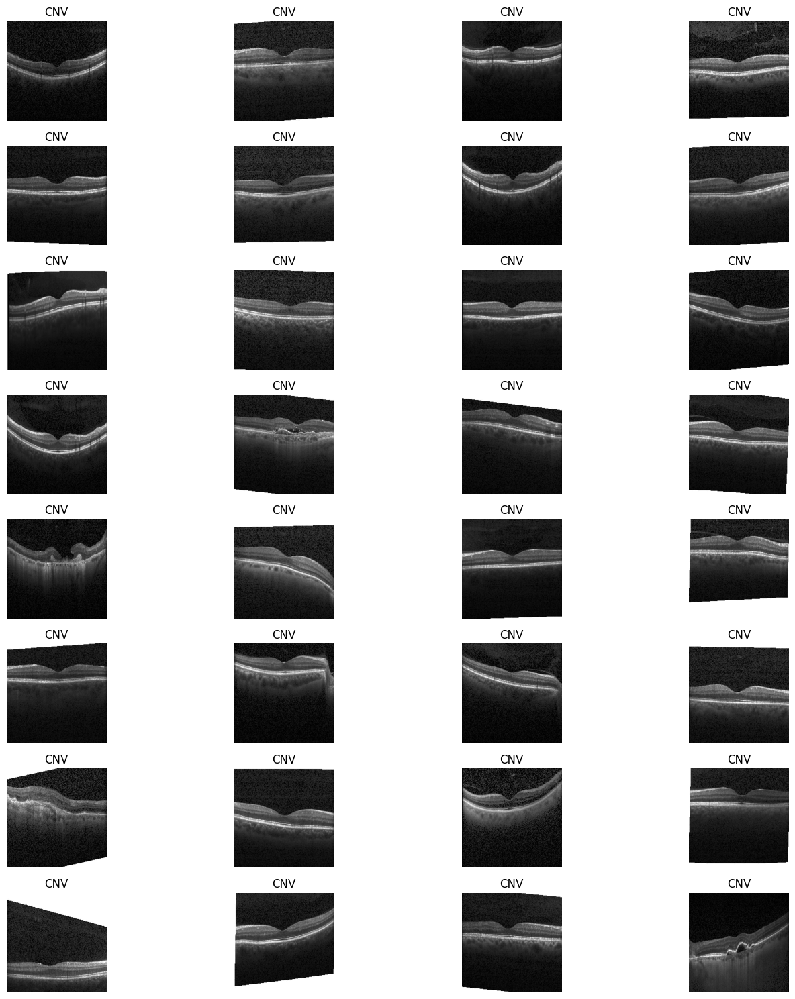

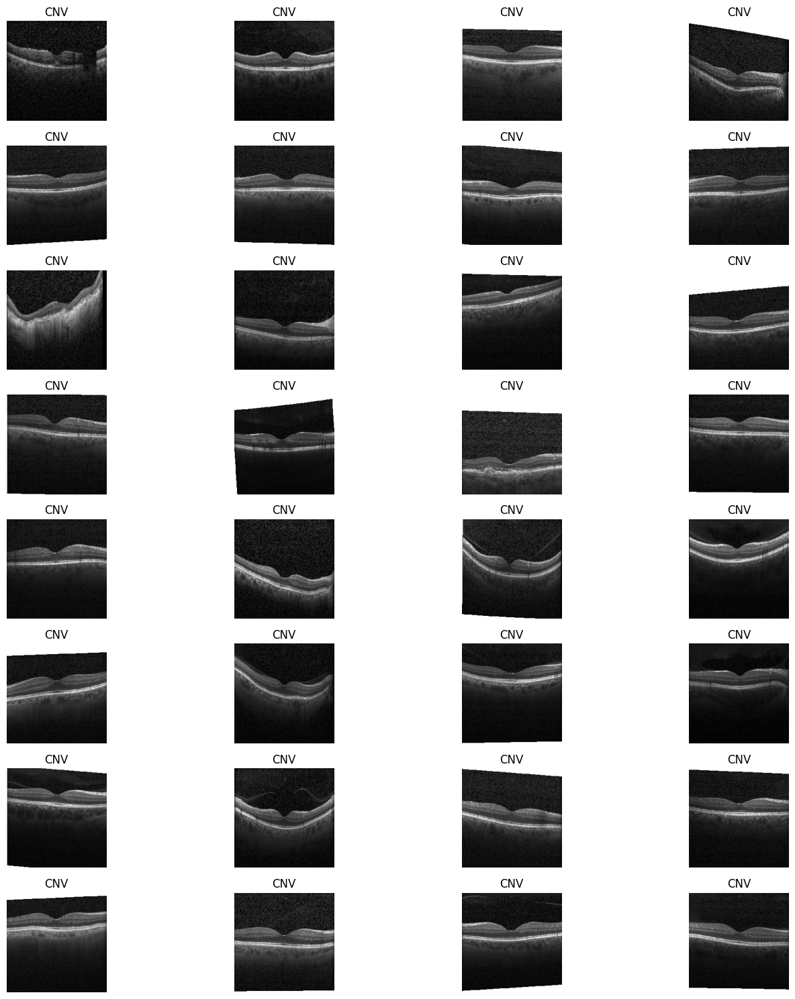

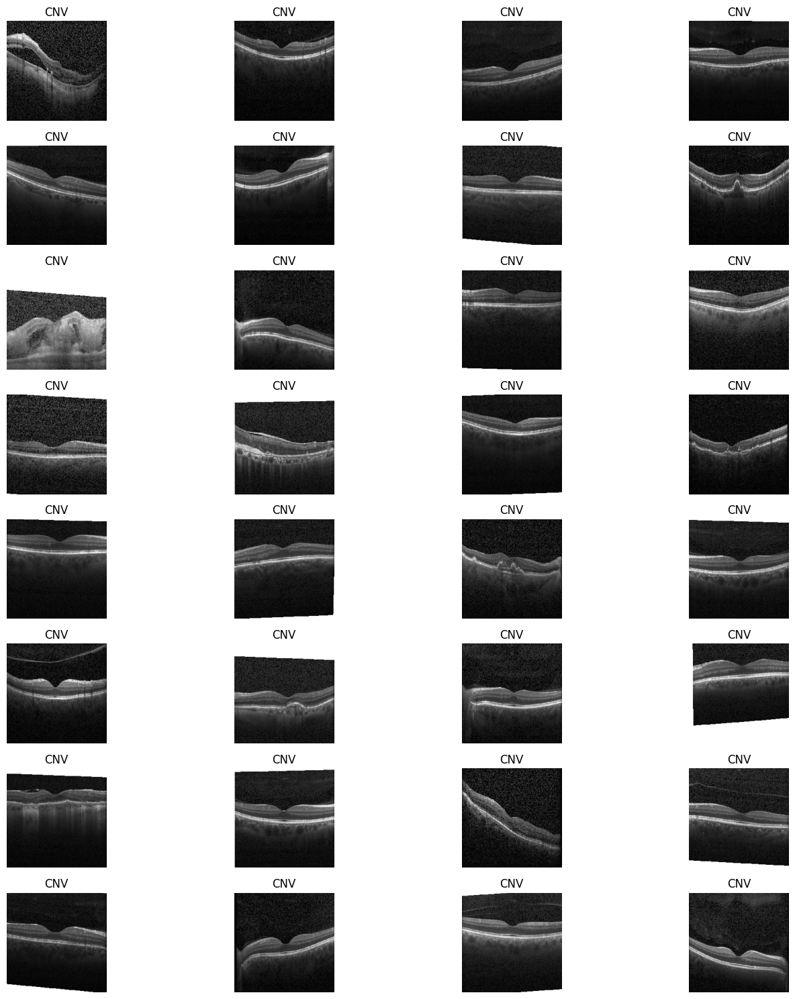

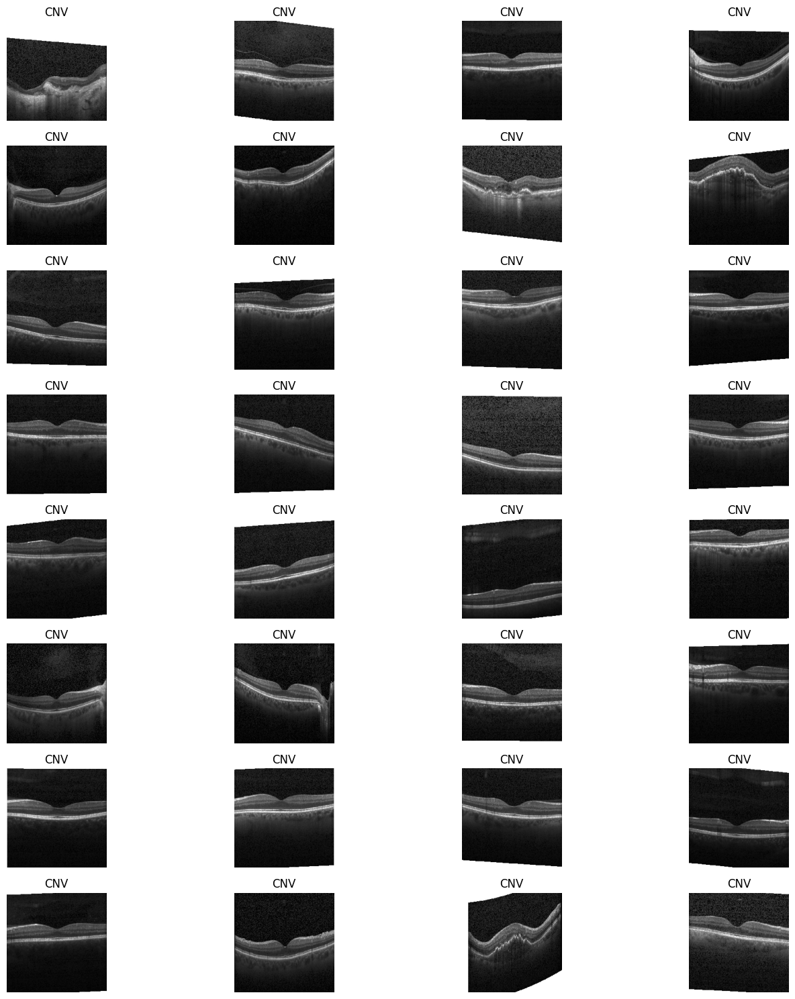

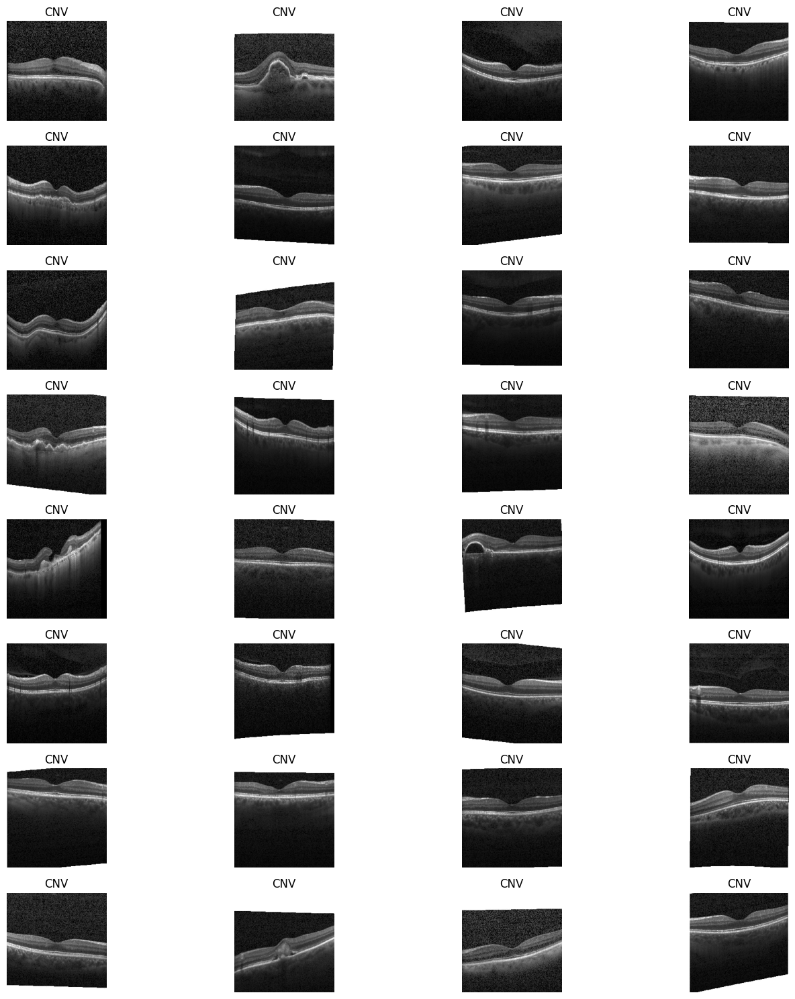

In [35]:
display_all_images(validation_generator, 5)

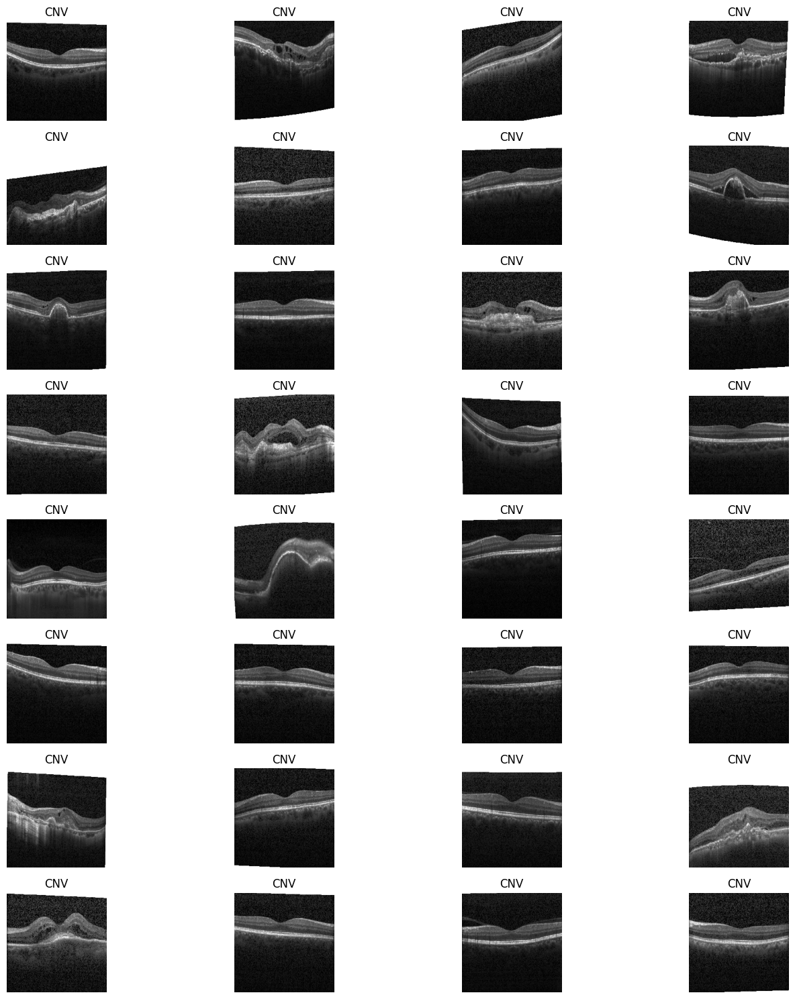

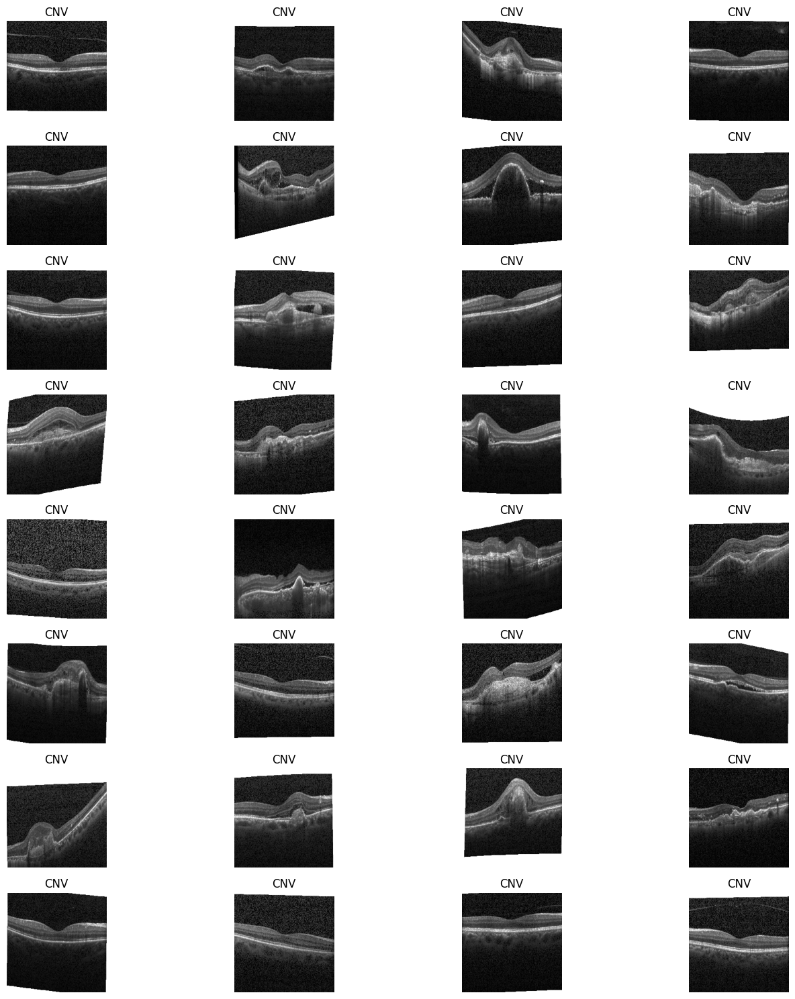

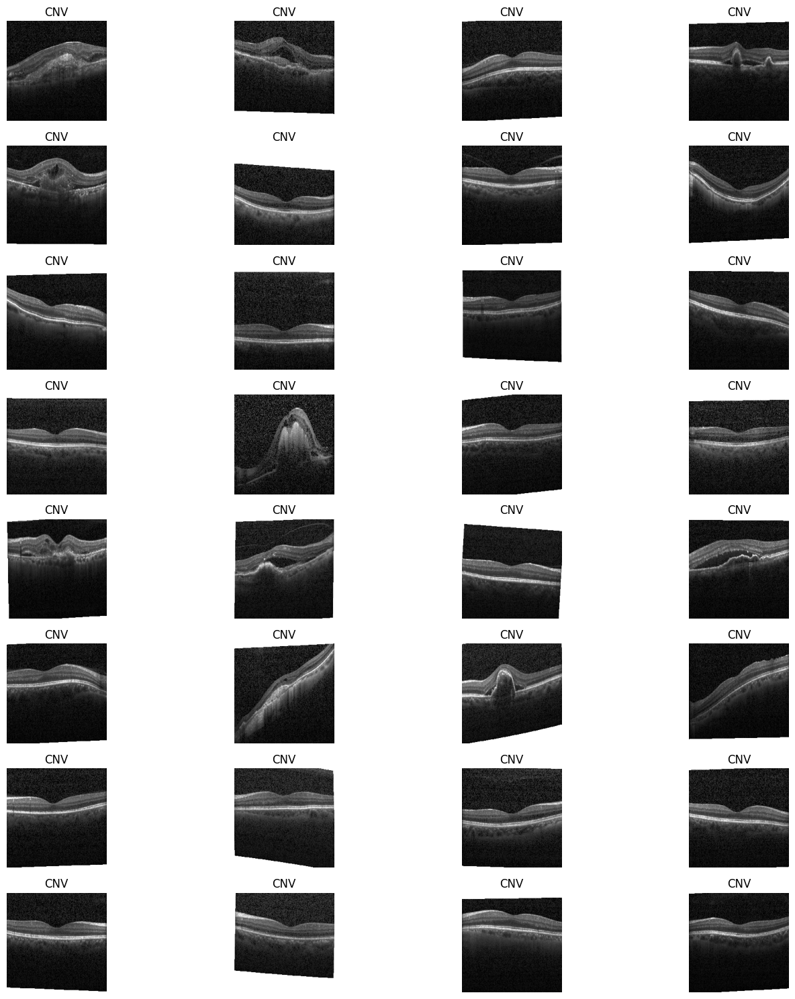

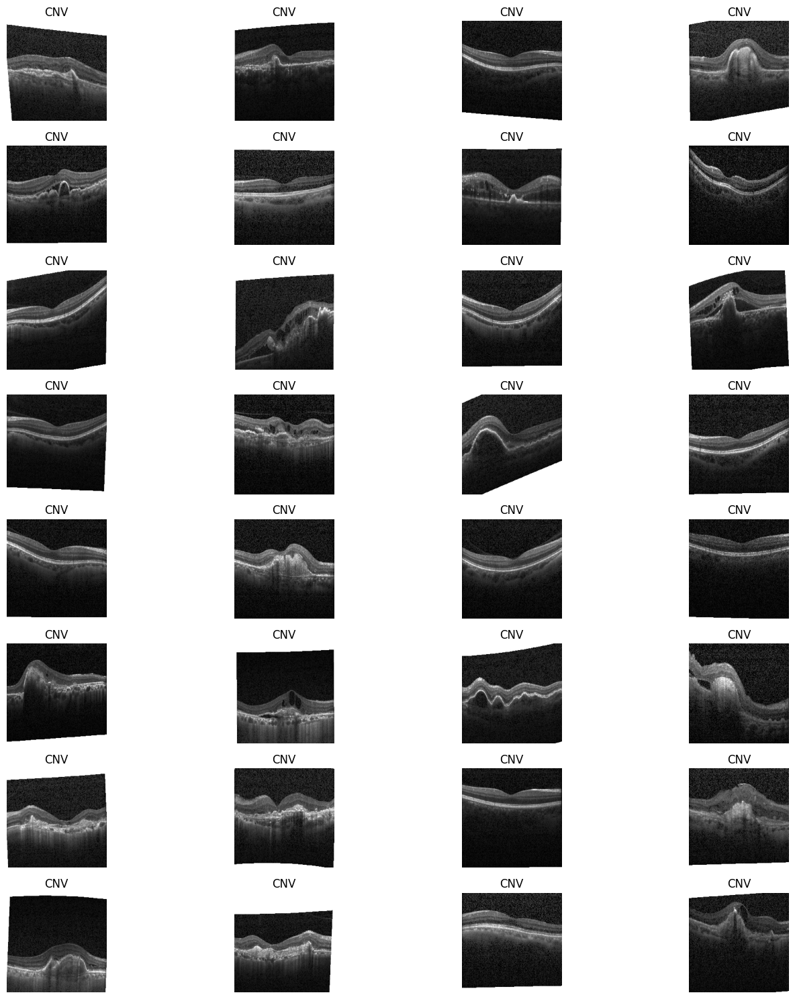

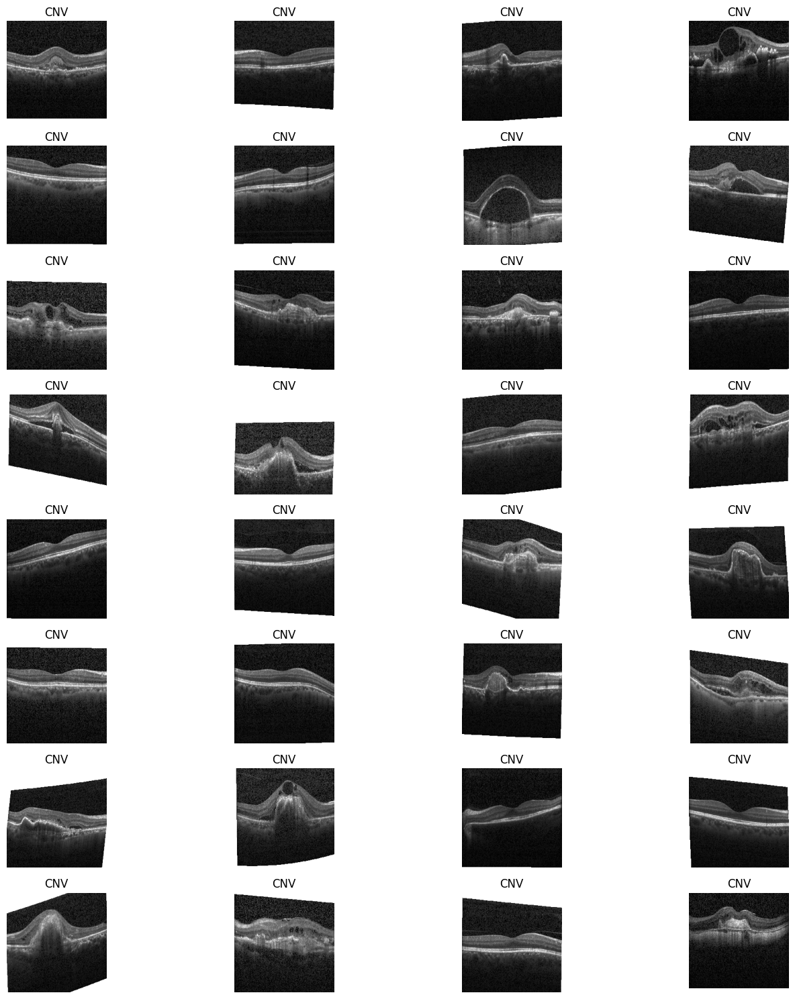

In [36]:

display_all_images(test_generator, 5)

In [37]:
# Purpose here was to look at grayscale distributions and possibly make some calculations, but
# abandoned this in favor of other metrics. 

def arrays(data, num_batches):
    
    # Initialize a list to store the image arrays and labels
    image_arrays = []
    labels_arrays = []

    for batch_num in range(num_batches):
        # Get a batch of data
        images, labels = next(data)

        # Randomly select an index
        idx = np.random.choice(images.shape[0])

        # Append the selected image and label to the respective lists
        image_arrays.append(images[idx])
        labels_arrays.append(labels[idx])

    # Return the image arrays and labels
    return image_arrays, labels_arrays



In [38]:
arrays(train_generator, 5)

([array([[[0.05882353],
          [0.07843138],
          [0.14509805],
          ...,
          [0.06666667],
          [0.07843138],
          [0.04313726]],
  
         [[0.07843138],
          [0.09803922],
          [0.1254902 ],
          ...,
          [0.08627451],
          [0.06666667],
          [0.04705883]],
  
         [[0.03921569],
          [0.10196079],
          [0.13725491],
          ...,
          [0.08627451],
          [0.07058824],
          [0.03921569]],
  
         ...,
  
         [[0.        ],
          [0.03529412],
          [0.00784314],
          ...,
          [0.00784314],
          [0.0509804 ],
          [0.02352941]],
  
         [[0.01568628],
          [0.        ],
          [0.02352941],
          ...,
          [0.00784314],
          [0.04313726],
          [0.03529412]],
  
         [[0.00784314],
          [0.        ],
          [0.        ],
          ...,
          [0.01960784],
          [0.03137255],
          [0.03529412]]], dtype=f

In [39]:
arrays(validation_generator, 5)

([array([[[0.08627451],
          [0.10196079],
          [0.1137255 ],
          ...,
          [0.13333334],
          [0.10196079],
          [0.04313726]],
  
         [[0.08235294],
          [0.08627451],
          [0.08235294],
          ...,
          [0.10980393],
          [0.10588236],
          [0.10588236]],
  
         [[0.08627451],
          [0.07843138],
          [0.07843138],
          ...,
          [0.12941177],
          [0.10196079],
          [0.0627451 ]],
  
         ...,
  
         [[0.00392157],
          [0.01176471],
          [0.01176471],
          ...,
          [0.00784314],
          [0.        ],
          [0.00392157]],
  
         [[0.        ],
          [0.01176471],
          [0.00392157],
          ...,
          [0.        ],
          [0.01176471],
          [0.00784314]],
  
         [[0.        ],
          [0.00784314],
          [0.00784314],
          ...,
          [0.        ],
          [0.00784314],
          [0.        ]]], dtype=f

In [40]:
arrays(test_generator, 5)

([array([[[1.        ],
          [1.        ],
          [1.        ],
          ...,
          [1.        ],
          [1.        ],
          [1.        ]],
  
         [[1.        ],
          [1.        ],
          [1.        ],
          ...,
          [1.        ],
          [1.        ],
          [1.        ]],
  
         [[1.        ],
          [1.        ],
          [1.        ],
          ...,
          [1.        ],
          [1.        ],
          [1.        ]],
  
         ...,
  
         [[0.00392157],
          [0.11764707],
          [0.05490196],
          ...,
          [0.10980393],
          [0.0627451 ],
          [0.07058824]],
  
         [[0.04313726],
          [0.03137255],
          [0.04313726],
          ...,
          [0.05882353],
          [0.08627451],
          [0.04705883]],
  
         [[0.10980393],
          [0.01176471],
          [0.03137255],
          ...,
          [0.        ],
          [0.12156864],
          [0.10196079]]], dtype=f

## Modelling 

In [16]:
# Start with a basic model

model = Sequential()



model.add(Conv2D(filters=32,  # standard minibatch size
                 kernel_size=(3, 3), # standard
                 activation='relu', # standard
                 input_shape=(224, 224, 1),# standard
                 padding='same')) # adding padding due to image border issues

model.add(MaxPooling2D(pool_size=(2, 2)))# standard
model.add(Conv2D(64, (3, 3), activation='relu')) # standard
model.add(MaxPooling2D((2, 2))) # standard
model.add(Conv2D(64, (3, 3), activation='relu')) # standard
model.add(Flatten()) # typical
model.add(Dense(64, activation='relu')) # typical
model.add(Dense(1, activation='sigmoid'))  # sigmoid with one neuron since binary

bce = tf.keras.losses.BinaryCrossentropy()  # BCE since we are dealing with binary target data

model.compile(optimizer='adam', loss=bce, metrics=['accuracy']) # typical

In [44]:
base_model = model.fit(
        train_generator,
        steps_per_epoch=1800,verbose =1,validation_data = validation_generator, 
        epochs=1)

1800/1800 [==============================] - 1746s 969ms/step - loss: 0.1114 - accuracy: 0.9586 - val_loss: 0.0346 - val_accuracy: 0.9894


In [45]:
# Really awesome results, but one epoch took 25 minutes!

test_x, test_y = next(test_generator)
results_test = model.evaluate(test_x, test_y, return_dict=True)

1/1 [==============================] - 0s 239ms/step - loss: 0.0268 - accuracy: 1.0000


In [51]:
# Running evaluation on test results 100 times to get an average

evaluation_results = []  

for i in range(100):
    test_x, test_y = next(test_generator)
    results_test = model.evaluate(test_x, test_y)
    evaluation_results.append(results_test)
    


1/1 [==============================] - 0s 256ms/step - loss: 0.1414 - accuracy: 0.9688


In [52]:
# Run test results 100 times and get the average
elements = [sublist[1] for sublist in evaluation_results]
accuracy_mean = np.array(elements).mean()
print(accuracy_mean)

0.9850624996423721


In [49]:
# Would be lovely to just use this extremely simple model, but we need to improve the compution time a lot. 
# Time to downsample!

In [12]:
7082 / 51140 # Ratio of disease images (cnv) to normal in training folders

0.13848259679311695

In [13]:
# Keeping this original ratio, with a goal of 10000 final images we have:

cnv_sample_size = 10000 * 0.13848259679311695
normal_sample_size = 10000 - cnv_sample_size

In [43]:

# Don't want to re-run this,  since the files have already been created!

# # Set new path from old
# train_cnv_path = 'train/CNV/'
# train_normal_path = 'train/NORMAL/'
# resampled_train_dir = 'resampled_train/'

# # Randomly sample from each folder
# train_cnv_files = [file for file in os.listdir(train_cnv_path) if file.endswith('.jpg') or file.endswith('.jpeg')]
# train_cnv_sample = random.sample(train_cnv_files, int(cnv_sample_size))

# train_normal_files = [file for file in os.listdir(train_normal_path) if file.endswith('.jpg') or file.endswith('.jpeg')]
# train_normal_sample = random.sample(train_normal_files, int(normal_sample_size))
# train_normal_sample
# # Copy the sampled files to the destination directory
# for file in train_cnv_sample:
#     source_file = os.path.join(train_cnv_path, file)
#     destination_file = os.path.join(resampled_train_dir, file)
#     shutil.copy2(source_file, destination_file)

# for file in train_normal_sample:
#     source_file = os.path.join(train_normal_path, file)
#     destination_file  = os.path.join(resampled_train_dir, file)
#     shutil.copy2(source_file, destination_file) 


In [14]:
resampled_train_dir_2 = 'resampled_train/' # Have to change directory b/c of how flow_from_directory reads "downward"
# Preprocessing
train_datagen_2 = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    
)

# Creating generators
train_generator_2 = train_datagen_2.flow_from_directory(
    resampled_train_dir_2,
    target_size=(224, 224),
    color_mode="grayscale",
    shuffle=True,  # Added shuffling and seed
    batch_size=32,
    class_mode='binary',
    seed=42
)

validation_generator_2 = train_datagen_2.flow_from_directory(
    resampled_train_dir_2,
    target_size=(224, 224),
    batch_size=32,
    color_mode='grayscale',
    class_mode='binary',
    shuffle=True,
    seed=42,
    subset='validation'
)

         
         

Found 9999 images belonging to 2 classes.
Found 1999 images belonging to 2 classes.


In [63]:
# Making sure our class balance is similar:

train_labels_2 = train_generator_2.classes
label, count = np.unique(train_labels_2, return_counts=True)
label_count = list(zip(label, count))
print(f'Train Label Count: {label_count}')

validation_labels_2 = validation_generator_2.classes
label, count = np.unique(validation_labels_2, return_counts=True)
label_count = list(zip(label, count))
print(f'Validation Label Count: {label_count}')

test_labels = test_generator.classes  # Keeping same test set
label, count = np.unique(test_labels, return_counts=True)
label_count = list(zip(label, count))
print(f'Test Label Count: {label_count}')




Train Label Count: [(0, 1384), (1, 8615)]
Validation Label Count: [(0, 276), (1, 1723)]
Test Label Count: [(0, 250), (1, 250)]


In [30]:
# Now let's run the same model on the downsampled dataset, adjusting for steps and epochs
# Gonna visualize the architecture with tensorboard!
%load_ext tensorboard
import tensorboard
from datetime import datetime
logdir="/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/logs" + datetime.now().strftime("%Y%m%d-%H%M%S")


tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir) # Writes logs

steps_per_epoch = 9999//34

base_model_2 = model.fit(
        train_generator_2,
        steps_per_epoch=steps_per_epoch,verbose =1,validation_data = validation_generator_2, 
        epochs=5,
        callbacks=tensorboard_callback
)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Epoch 1/5
294/294 [==============================] - 462s 2s/step - loss: 0.0194 - accuracy: 0.9932 - val_loss: 0.0180 - val_accuracy: 0.9920
Epoch 2/5
294/294 [==============================] - 479s 2s/step - loss: 0.0172 - accuracy: 0.9947 - val_loss: 0.0117 - val_accuracy: 0.9970
Epoch 3/5
294/294 [==============================] - 492s 2s/step - loss: 0.0137 - accuracy: 0.9960 - val_loss: 0.0051 - val_accuracy: 0.9985
Epoch 4/5
294/294 [==============================] - 485s 2s/step - loss: 0.0073 - accuracy: 0.9979 - val_loss: 9.1064e-04 - val_accuracy: 1.0000
Epoch 5/5
294/294 [==============================] - 475s 2s/step - loss: 0.0098 - accuracy: 0.9969 - val_loss: 0.0017 - val_accuracy: 1.0000


In [31]:
%tensorboard --logdir logs 

Reusing TensorBoard on port 6006 (pid 9168), started 1:08:51 ago. (Use '!kill 9168' to kill it.)

In [ ]:
print(model.summary())
print(model.metrics_names)

In [32]:
# Amazing results! 5 epochs took about 30 minutes, so 50% MORE previous model but with better scores via more
# epochs, and no detectable overfitting based on test score data below! Validation loss and accuracy is also very close
# to training loss and accuracy, so another sign we are not overfitting!

# Let's check the test scores (same test data as before - no need to resample it)
test_x, test_y = next(test_generator)
results_test = model.evaluate(test_x, test_y)

# Let's run this 100 times like before and get our average:


1/1 [==============================] - 0s 404ms/step - loss: 0.0033 - accuracy: 1.0000


In [33]:
evaluation_results_2 = []  # List to store the evaluation results

for i in range(50):
    test_x, test_y = next(test_generator)
    results_test = model.evaluate(test_x, test_y)
    evaluation_results_2.append(results_test)
  

1/1 [==============================] - 0s 382ms/step - loss: 0.0444 - accuracy: 0.9688


1/1 [==============================] - 0s 373ms/step - loss: 0.3739 - accuracy: 0.8438


In [70]:
elements = [sublist[1] for sublist in evaluation_results]
accuracy_mean = np.array(elements).mean()
print(accuracy_mean)

# Got a slightly lower average test mean accuracy score. I wonder why, since it didn't seem we were overfitting?

0.976875


In [35]:
print(model.summary())
print(model.metrics_names)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 110, 110, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 55, 55, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 53, 53, 64)        36928     
                                                                 
 flatten (Flatten)           (None, 179776)            0

In [ ]:
# This model is really excellent, but that was too easy! Let's try it with one more ocular disease, and then maybe 
# try a model that can tell between the two diseases? Maybe for future! For now, let's just play around with our base model
# and see what different parameters do. Maybe we can get a 100% score?

In [6]:
# Paper on replacing max pooling with stride = 2: https://arxiv.org/abs/1412.6806, 
# and modifying the adam learning rate (from default of .001 to .01).
# We are also going to set it up so that we can produce a TensorBoard visualizationof our model!


adam = Adam(learning_rate=.01)    
model = Sequential()



model.add(Conv2D(filters=32,
                 kernel_size=(3, 3),
                 strides=2, # Let's try with stride. Can help see new features that pooling misses. 
                 activation='relu', 
                 padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  

bce = tf.keras.losses.BinaryCrossentropy()  
model.compile(optimizer=adam, loss=bce, metrics=['accuracy'])

NameError: name 'Adam' is not defined

In [7]:
# Let's fit this new model with the Tensorboard setup to the same downsampled data and see what happens
%load_ext tensorboard
import tensorboard
from datetime import datetime
logdir="logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
import keras
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)
base_model_3 = model.fit(
        train_generator_2,
        steps_per_epoch=steps_per_epoch,verbose =1,validation_data = validation_generator_2, 
        epochs=10)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


NameError: name 'model' is not defined

In [1]:
# Even though this model is terrible, let's look at the TensorBoard results!
%tensorboard --logdir logs

UsageError: Line magic function `%tensorboard` not found.


In [3]:
acc = base_model_3.history['accuracy']
val_acc = base_model_3.history['val_accuracy']
loss = base_model.history['loss']
val_loss = base_model_3.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

NameError: name 'base_model_2' is not defined

In [77]:
evaluation_results = []  # List to store the evaluation results

for i in range(100):
    test_x, test_y = next(test_generator)
    results_test = model.evaluate(test_x, test_y)
    evaluation_results.append(results_test)

1/1 [==============================] - 0s 82ms/step - loss: 0.9532 - accuracy: 0.5625


In [78]:
elements = [sublist[1] for sublist in evaluation_results]
accuracy_mean = np.array(elements).mean()
print(accuracy_mean)

0.5006249997019768


In [79]:
# The adam learning rate increase really messed us up, though the  model was very fast! Let's return to the default
# value and just try with strides in the input layer (**we had done this previously and edited the learning rate of
# the same model later**)

adam = Adam(learning_rate=.001)    
model = Sequential()



model.add(Conv2D(filters=32,
                 kernel_size=(3, 3),
                 strides=2, # Let's try with stride. Can help see new features that pooling misses. 
                 activation='relu', 
                 padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  

bce = tf.keras.losses.BinaryCrossentropy()  
model.compile(optimizer=adam, loss=bce, metrics=['accuracy'])

In [ ]:
base_model_4 = model.fit(
        train_generator_2,
        steps_per_epoch=steps_per_epoch,verbose =1,validation_data = validation_generator_2, 
        epochs=10)

In [ ]:
# A bit worse! Let's try adding strides (apparently input layer is wrong place!) and dropping max pooling
model = Sequential()



model.add(Conv2D(filters=32,
                 kernel_size=(3, 3),
                 activation='relu', 
                 padding='same'))

model.add(Conv2D(64, (3, 3), activation='relu', strides=2))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu', strides=2))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid')) 

bce = tf.keras.losses.BinaryCrossentropy()  
model.compile(optimizer='adam', loss=bce, metrics=['accuracy'])

In [ ]:
base_model_5 = model.fit(
        train_generator_2,
        steps_per_epoch=steps_per_epoch,verbose =1,validation_data = validation_generator_2, 
        epochs=10)

In [ ]:
print(model.summary())

In [ ]:

# Let's try a VGG

# Early stopping stuff

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

# This callback will stop the training when there is no improvement in
# the loss for three consecutive epochs.

# len(history.history['loss'])  # Only 4 epochs are run.

vgg_model = VGG16(weights=None, include_top=True, input_shape=(224, 224, 1), pooling=max, classes=2)

vggmodel = Sequential()
vggmodel.add(vgg_model)
vggmodel.add(tf.keras.layers.Flatten())
vggmodel.add(tf.keras.layers.Dense(256, activation='relu'))
vggmodel.add(tf.keras.layers.Dropout(0.5))
vggmodel.add(tf.keras.layers.Dense(1, activation='sigmoid'))

vggmodel.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


base_model_6 = vggmodel.fit(
        train_generator_2,
        steps_per_epoch=steps_per_epoch,
        epochs=10,
        verbose=1,
        validation_data= validation_generator_2,
        callbacks=callback  # Early stopping because VGG is so time-intensive!
)


Epoch 1/10
  5/294 [..............................] - ETA: 1:28:18 - loss: 0.6557 - accuracy: 0.7250

In [ ]:
image noise (see bookmark)
adam lr=.0001 etc
tensorboard
save model
visualize activation functions (see Canvas)


In [ ]:
# early stopping stuff

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
# This callback will stop the training when there is no improvement in
# the loss for three consecutive epochs.

history = model.fit(np.arange(100).reshape(5, 20), np.zeros(5),
                    epochs=10, batch_size=1, callbacks=[callback],
                    verbose=0)
len(history.history['loss'])  # Only 4 epochs are run.